In [17]:
import pyfpgrowth
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import random
from collections import defaultdict
from collections import defaultdict

In [18]:
import pandas as pd
# Load your CSV data
data = pd.read_csv('transactions_list.csv')
# Assuming your CSV has a column named 'Transaction' where Transaction are separated by commas
data['Transaction'] = data['Transaction'].apply(lambda x: x.split(','))
# Create a list of transactions
transactions = data['Transaction'].tolist()

In [19]:
# ==================== Hiển thị giao dịch dưới dạng bảng ====================
transactions_df = pd.DataFrame({"ID": [f"{i+1}" for i in range(len(transactions))],
                                "Items": [", ".join(trans) for trans in transactions]})
print(transactions_df.to_markdown(index=False, tablefmt="grid"))

+------+-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|   ID | Items                                                                                                                                                                                                                                                                                                                                                                                                                       |
+======+==================================================================================================================================================

In [20]:
# ==================== Định nghĩa min_sup ====================
min_sup = 0.001  # Đặt ngưỡng hỗ trợ tối thiểu

# ==================== Đếm tần suất xuất hiện của item ====================
item_counts = defaultdict(int)
for trans in transactions:
    for item in trans:
        item_counts[item] += 1

# Lọc ra các item có tần suất >= min_sup
filtered_items = {item: count for item, count in item_counts.items() if count >= min_sup}

# Sắp xếp theo thứ tự giảm dần tần suất
sorted_items = sorted(filtered_items.items(), key=lambda x: x[1], reverse=True)

# ==================== Tạo bảng tần suất ====================
freq_df = pd.DataFrame(sorted_items, columns=["Item", "Frequency"])
print("📌 Bảng tần suất (đã lọc theo min_sup):")
print(freq_df.to_markdown(index=False, tablefmt="grid"))

# ==================== Mã hóa các item thành số thứ tự ====================
item_encoding = {item: idx + 1 for idx, (item, _) in enumerate(sorted_items)}

# ==================== Tạo bảng mã hóa ====================
encoded_df = pd.DataFrame(list(item_encoding.items()), columns=["Item", "Encoded"])
print("\n📌 Bảng mã hóa:")
print(encoded_df.to_markdown(index=False, tablefmt="grid"))

# ==================== Mã hóa dữ liệu giao dịch ====================
encoded_data = []
for trans in transactions:
    encoded_trans = [item_encoding[item] for item in trans if item in item_encoding]
    if encoded_trans:  # Bỏ qua giao dịch rỗng
        encoded_data.append(encoded_trans)

📌 Bảng tần suất (đã lọc theo min_sup):
+---------------------------+-------------+
| Item                      |   Frequency |
+===========================+=============+
| whole milk                |        2513 |
+---------------------------+-------------+
| other vegetables          |        1903 |
+---------------------------+-------------+
| rolls/buns                |        1809 |
+---------------------------+-------------+
| soda                      |        1715 |
+---------------------------+-------------+
| yogurt                    |        1372 |
+---------------------------+-------------+
| bottled water             |        1087 |
+---------------------------+-------------+
| root vegetables           |        1072 |
+---------------------------+-------------+
| tropical fruit            |        1032 |
+---------------------------+-------------+
| shopping bags             |         969 |
+---------------------------+-------------+
| sausage                   |        

In [21]:
# ==================== Sắp xếp encoded_data theo thứ tự phổ biến ====================
sorted_encoded_transactions = []
for trans in encoded_data:
    sorted_trans = sorted(trans)
    if sorted_trans:
        sorted_encoded_transactions.append(sorted_trans)

# ==================== Hiển thị kết quả ====================
print("\n📌 Dữ liệu đã mã hóa (sắp xếp theo thứ tự phổ biến):")
for i, trans in enumerate(sorted_encoded_transactions, 1):
    print(f"Giao dịch {i}: {trans}")


📌 Dữ liệu đã mã hóa (sắp xếp theo thứ tự phổ biến):
Giao dịch 1: [12, 22, 64, 149]
Giao dịch 2: [5, 8, 23]
Giao dịch 3: [1]
Giao dịch 4: [5, 16, 33, 123]
Giao dịch 5: [1, 2, 36, 87]
Giao dịch 6: [1, 5, 25, 102, 129]
Giao dịch 7: [3]
Giao dịch 8: [2, 3, 13, 39, 101]
Giao dịch 9: [68]
Giao dịch 10: [1, 112]
Giao dịch 11: [2, 6, 8, 29, 32]
Giao dịch 12: [1, 5, 6, 8, 12, 25, 26, 66, 67]
Giao dịch 13: [27]
Giao dịch 14: [3, 4, 21]
Giao dịch 15: [8, 31]
Giao dịch 16: [14, 17, 25, 38]
Giao dịch 17: [17]
Giao dịch 18: [76]
Giao dịch 19: [29]
Giao dịch 20: [50]
Giao dịch 21: [2]
Giao dịch 22: [11, 49]
Giao dịch 23: [1]
Giao dịch 24: [8, 14, 33, 60, 70]
Giao dịch 25: [2, 3, 7, 8, 34, 35, 45, 67, 82, 92, 139]
Giao dịch 26: [6, 15]
Giao dịch 27: [5]
Giao dịch 28: [3, 4, 10, 29]
Giao dịch 29: [2]
Giao dịch 30: [4, 9, 14, 15, 17, 19]
Giao dịch 31: [5, 6, 50, 51]
Giao dịch 32: [2, 3, 6, 28, 40, 42, 117]
Giao dịch 33: [1, 2, 7, 38, 51]
Giao dịch 34: [1, 2, 4, 18, 24, 41, 129, 132]
Giao dịch 35: [27, 

In [22]:
# ==================== Xây dựng FP-Tree ====================
class FPTreeNode:
    def __init__(self, item, count, parent):
        self.item = item
        self.count = count
        self.parent = parent
        self.children = {}
        self.link = None  # Liên kết với node cùng item
    
    def increase(self, count):
        self.count += count

class FPTree:
    def __init__(self):
        self.root = FPTreeNode("Root", 0, None)
        self.header_table = defaultdict(list)  # Lưu danh sách các node có cùng item

    def insert_transaction(self, transaction, count=1):
        current_node = self.root
        for item in transaction:
            if item in current_node.children:
                current_node.children[item].increase(count)
            else:
                new_node = FPTreeNode(item, count, current_node)
                current_node.children[item] = new_node
                self.header_table[item].append(new_node)  # Lưu tất cả các node có cùng item
            
            current_node = current_node.children[item]

    def build_tree(self, transactions):
        for transaction in transactions:
            self.insert_transaction(transaction)

# ==================== Xây dựng FP-Tree với dữ liệu đã xử lý ====================
fp_tree = FPTree()
fp_tree.build_tree(sorted_encoded_transactions)

# ==================== Hiển thị kết quả FP-Tree ====================
def print_tree(node, indent=0):
    print(" " * indent + f"({node.item}: {node.count})")
    for child in node.children.values():
        print_tree(child, indent + 4)

print("\n📌 FP-Tree Structure:")
print_tree(fp_tree.root)



📌 FP-Tree Structure:
(Root: 0)
    (12: 101)
        (22: 4)
            (64: 1)
                (149: 1)
            (27: 2)
                (33: 2)
                    (108: 1)
                    (35: 1)
                        (38: 1)
                            (59: 1)
                                (65: 1)
                                    (67: 1)
                                        (78: 1)
        (14: 9)
            (105: 1)
            (22: 2)
                (25: 2)
                    (32: 1)
                        (33: 1)
                            (48: 1)
                    (47: 1)
                        (87: 1)
                            (121: 1)
            (37: 1)
            (64: 1)
            (16: 1)
                (19: 1)
                    (21: 1)
                        (23: 1)
                            (44: 1)
                                (53: 1)
                                    (63: 1)
            (27: 1)
                (52: 1)
        (1

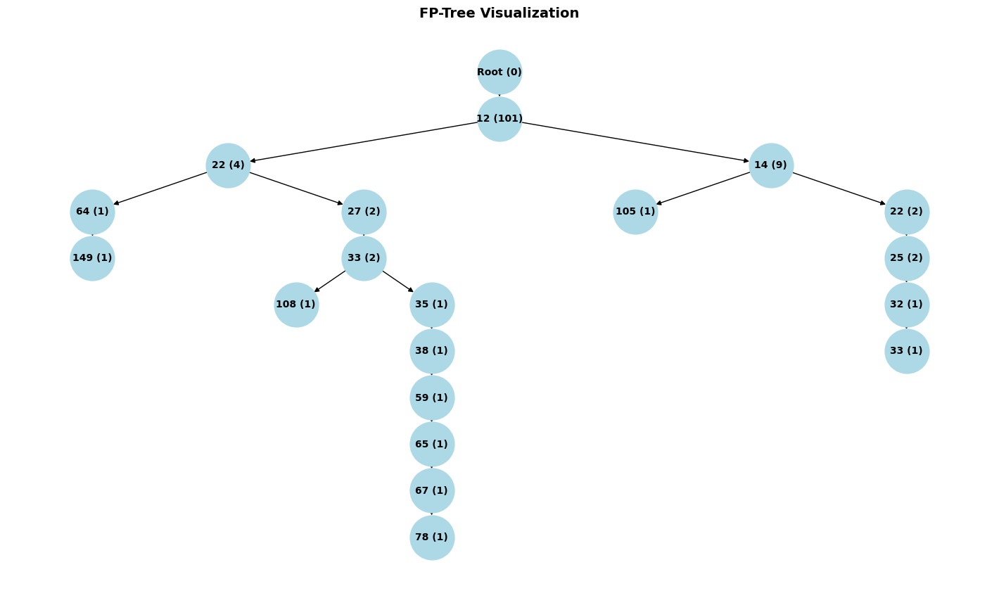

In [23]:
import networkx as nx
import matplotlib.pyplot as plt

# ==================== Vẽ FP-Tree ====================
G = nx.DiGraph()
node_labels = {}  # Lưu nhãn thực sự của node
max_nodes = 20  # Giới hạn số lượng node hiển thị
node_count = 0  # Đếm số lượng node đã thêm

def add_edges(node, parent_node=None):
    global node_count
    if node_count >= max_nodes:
        return  # Dừng nếu đã đạt giới hạn

    node_id = id(node)  # Dùng ID để tránh trùng lặp trong đồ thị
    node_label = f"{node.item} ({node.count})"  # Nhãn hiển thị
    
    G.add_node(node_id)
    node_labels[node_id] = node_label  # Lưu nhãn thực sự
    node_count += 1  # Tăng số lượng node đã thêm
    
    if parent_node:
        parent_id = id(parent_node)
        G.add_edge(parent_id, node_id)
    
    for child in node.children.values():
        add_edges(child, node)

# Xây dựng đồ thị từ FP-Tree
add_edges(fp_tree.root)

# ==================== Bố trí cây FP-Tree ====================
def hierarchy_pos(G, root, width=1.5, vert_gap=0.3, xcenter=0.5, pos=None, level=0):
    if pos is None:
        pos = {root: (xcenter, 1)}
    else:
        pos[root] = (xcenter, 1 - level * vert_gap)
    
    children = list(G.successors(root))
    if not children:
        return pos
    
    dx = width / max(len(children), 1)
    nextx = xcenter - width / 2 + dx / 2
    for child in children:
        pos = hierarchy_pos(G, child, width=dx, vert_gap=vert_gap, xcenter=nextx, pos=pos, level=level+1)
        nextx += dx
    
    return pos

# ==================== Vẽ FP-Tree ====================
plt.figure(figsize=(14, 8))
root_id = id(fp_tree.root)
pos = hierarchy_pos(G, root=root_id)
nx.draw(G, pos, labels=node_labels, with_labels=True, node_size=2000, node_color="lightblue", edge_color="black", linewidths=1.5, font_size=10, font_weight="bold", arrows=True)
plt.title("FP-Tree Visualization", fontsize=14, fontweight="bold")
plt.show()


In [24]:
def find_frequent_patterns(fp_tree, min_support):
    def mine_tree(node, suffix, frequent_patterns):
        if node.item is not None:  # Bỏ qua root node
            new_suffix = suffix + [node.item]
            frequent_patterns[tuple(new_suffix)] = node.count
        
        for child in sorted(node.children.values(), key=lambda n: n.count):
            mine_tree(child, new_suffix, frequent_patterns)
    
    frequent_patterns = {}
    mine_tree(fp_tree.root, [], frequent_patterns)
    return {k: v for k, v in frequent_patterns.items() if v >= min_support}

# Gọi hàm để tìm tập phổ biến
min_support = 3  # Ngưỡng hỗ trợ tối thiểu
frequent_itemsets = find_frequent_patterns(fp_tree, min_support)

# In kết quả
for itemset, support in frequent_itemsets.items():
    print(f"{itemset}: {support}")

('Root', 97): 3
('Root', 96): 3
('Root', 56): 3
('Root', 100): 3
('Root', 86): 3
('Root', 139): 3
('Root', 92): 3
('Root', 70): 4
('Root', 126): 4
('Root', 84): 4
('Root', 71): 4
('Root', 103): 4
('Root', 65): 4
('Root', 121): 4
('Root', 142): 4
('Root', 158): 4
('Root', 98): 5
('Root', 82): 5
('Root', 85): 5
('Root', 125): 5
('Root', 53): 5
('Root', 94): 5
('Root', 107): 5
('Root', 73): 6
('Root', 109): 6
('Root', 101): 6
('Root', 79): 6
('Root', 78): 6
('Root', 93): 6
('Root', 105): 6
('Root', 52): 7
('Root', 140): 7
('Root', 148): 7
('Root', 58): 8
('Root', 57): 8
('Root', 55): 8
('Root', 76): 9
('Root', 113): 10
('Root', 89): 10
('Root', 61): 12
('Root', 74): 12
('Root', 64): 12
('Root', 43): 12
('Root', 81): 13
('Root', 66): 13
('Root', 68): 14
('Root', 49): 14
('Root', 49, 55): 3
('Root', 33): 15
('Root', 41): 16
('Root', 60): 16
('Root', 32): 17
('Root', 48): 17
('Root', 62): 19
('Root', 59): 19
('Root', 39): 19
('Root', 37): 20
('Root', 37, 44): 3
('Root', 38): 20
('Root', 40):